In [1]:
!date

Mon Nov  9 11:37:40 PST 2020


# Subclass labels location merfish

In [5]:
import anndata
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.patches as mpatches
import scanpy as scanp
from scipy.stats import ks_2samp, ttest_ind
from scipy.sparse import csr_matrix
from sklearn.decomposition import TruncatedSVD
from sklearn.manifold import TSNE
from umap import UMAP
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
from sklearn.preprocessing import LabelEncoder
from sklearn.neighbors import NeighborhoodComponentsAnalysis
from matplotlib import cm
from scipy.spatial import ConvexHull
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import normalize

import sys
sys.path.append('/home/sina/projects/mop/BYVSTZP_2020/trackfig')
from trackfig.utils import get_notebook_name
from trackfig.trackfig import trackfig 

TRACKFIG = "/home/sina/projects/mop/BYVSTZP_2020/trackfig.txt"
NB = get_notebook_name()

import warnings
warnings.filterwarnings('ignore')

fsize=20

plt.rcParams.update({'font.size': fsize})
%config InlineBackend.figure_format = 'retina'

In [6]:
mfish = anndata.read_h5ad("../../data/notebook/revision/merfish-updated.h5ad")

In [7]:
mfish

AnnData object with n_obs × n_vars = 280327 × 254
    obs: 'fovID', 'fov_x', 'fov_y', 'volume', 'center_x', 'center_y', 'slice_id', 'sample_id', 'label', 'subclass', 'class_label', 'cell_id'
    var: 'n_iso'
    layers: 'X', 'log1p', 'norm'

In [8]:
mfish.obs

,fovID,fov_x,fov_y,volume,center_x,center_y,slice_id,sample_id,label,subclass,class_label,cell_id
0,13,4539.310,2986.899,992.830060,4738.397298,3075.327399,mouse2_slice31,dataset2_sample4,Astro_1,Astrocytes,Other,0
1,290,-4016.860,1404.780,610.091871,-3964.711404,1451.889047,mouse2_slice160,dataset2_sample5,Endo,Endothelial,Other,1
2,113,750.406,1143.102,148.277718,805.843523,1215.035473,mouse2_slice109,dataset2_sample6,SMC,SMC,Other,2
3,432,1262.680,-3752.030,249.515471,1348.686198,-3589.955255,mouse1_slice71,dataset1_sample2,Endo,Endothelial,Other,3
4,354,-3627.450,-1987.730,1779.831996,-3584.650904,-1883.105955,mouse2_slice219,dataset2_sample5,L23_IT_3,L23_IT,Glutamatergic,4
...,...,...,...,...,...,...,...,...,...,...,...,...
280322,386,774.760,913.600,1208.963097,890.666985,1069.905972,mouse1_slice251,dataset1_sample5,Pvalb_1,Pvalb,GABAergic,280322
280323,327,1910.380,1079.280,611.167089,1913.334949,1280.947292,mouse2_slice261,dataset2_sample3,L5_PT_5,L5_PT,Glutamatergic,280323
280324,89,3659.910,3432.540,130.928366,3847.387896,3589.662245,mouse1_slice112,dataset1_sample3,L45_IT_4,L45_IT,Glutamatergic,280324
280325,300,2510.380,1279.280,799.847696,2728.208220,1376.136296,mouse2_slice261,dataset2_sample3,L5_PT_2,L5_PT,Glutamatergic,280325


In [9]:
np.sort(mfish.obs.subclass.unique()).tolist()

['Astrocytes',
 'Endothelial',
 'L23_IT',
 'L45_IT',
 'L56_NP',
 'L5_IT',
 'L5_PT',
 'L6_CT',
 'L6_IT',
 'L6_IT_Car3',
 'L6b',
 'Lamp5',
 'Microglia',
 'OPC',
 'Oligodendrocytes',
 'PVM',
 'Pericytes',
 'Pvalb',
 'SMC',
 'Sncg',
 'Sst',
 'Sst_Chodl',
 'VLMC',
 'Vip',
 'other']

In [10]:
cluster_cmap = {
"Astro": (0.38823529411764707, 0.4745098039215686,  0.2235294117647059 ),  # 637939,
"Endo" : (0.5490196078431373,  0.6352941176470588,  0.3215686274509804 ),  # 8ca252,
"SMC"  : (0.7098039215686275,  0.8117647058823529,  0.4196078431372549 ),  # b5cf6b,
"VLMC" : (0.807843137254902,   0.8588235294117647,  0.611764705882353  ),  # cedb9c,
"other" : (0,0,0),
"L2/3 IT" : (0.9921568627450981,  0.6823529411764706,  0.4196078431372549  ),  # fdae6b
"L5 PT" : (0.9921568627450981,  0.8156862745098039,  0.6352941176470588  ),  # fdd0a2
"L5 IT" : (0.5176470588235295,  0.23529411764705882, 0.2235294117647059 ),  # 843c39
"L5/6 NP": "#D43F3A",
"L6 CT" : (0.8392156862745098,  0.3803921568627451,  0.4196078431372549 ),  # d6616b
"L6 IT" : (0.9058823529411765,  0.5882352941176471,  0.611764705882353  ),  # e7969c
"L6b" : (1.0,                 0.4980392156862745,  0.054901960784313725),  # ff7f0e
"L6 IT Car3" : (1.0,                 0.7333333333333333,  0.47058823529411764 ),  # ffbb78
"Lamp5" : (0.19215686274509805, 0.5098039215686274,  0.7411764705882353  ),  # 3182bd # blues
"Sncg" : (0.4196078431372549,  0.6823529411764706,  0.8392156862745098  ),  # 6baed6
"Vip" : (0.6196078431372549,  0.792156862745098,   0.8823529411764706  ),  # 9ecae1
"Sst" : (0.7764705882352941,  0.8588235294117647,  0.9372549019607843  ),  # c6dbef
"Pvalb":(0.7372549019607844,  0.7411764705882353,  0.8627450980392157  ),  # bcbddc
"Ependymal":     (0.596078431372549,   0.8745098039215686,  0.5411764705882353  ),  # 98df8a
"L4/5_IT": "#846239",
"Macrophages": (0.6196078431372549,  0.6039215686274509,  0.7843137254901961  ),  # 9e9ac8
"Microglia":     (0.17254901960784313, 0.6274509803921569,  0.17254901960784313 ),  # 2ca02c,
"OPC": (0.7372549019607844,  0.7411764705882353,  0.8627450980392157  ),  # bcbddc
"Oligodendrocytes": (0.8549019607843137,  0.8549019607843137,  0.9215686274509803  ) , # dadaeb
"Pericytes": "pink",
"Sst_Chodl": "#c6efef",
}



In [11]:
le = LabelEncoder()
mfish.obs["subclass_id"] = le.fit_transform(mfish.obs.subclass.values)

In [12]:
def trim_axs(axs, N):
    """little helper to massage the axs list to have correct length..."""
    axs = axs.flat
    for ax in axs[N:]:
        ax.remove()
    return axs[:N]

In [13]:
slice_id = mfish.obs.slice_id.values
slice_id = np.unique(slice_id)

In [14]:
gb = mfish.obs.groupby("slice_id")["center_x", "center_y"]

In [15]:
unique_map = {'Astrocytes': "Astro",
'Endothelial':"Endo",
'SMC':"SMC",
'L23_IT':"L2/3 IT",
'VLMC': "VLMC",
'L6_CT': "L6 CT",
'L45_IT': "L4/5 IT",
'L5_PT': "L5 PT",
'L5_IT': "L5 IT",
'Sst': "Sst",
'L6_IT': "L6 IT",
'Sncg': "Sncg",
'L6_IT_Car3': "L6 IT Car3",
'Vip': "Vip",
'L56_NP': "L5/6 NP",
'Pvalb': "Pvalb",  
'L6b': "L6b",
'Lamp5': "Lamp5"}

inv_map = {v: k for k, v in unique_map.items()}

In [16]:
mfish.obs.subclass = mfish.obs.subclass.apply(lambda x: unique_map.get(x,x))

In [17]:
unique_subclass = np.unique(mfish.obs.subclass)

In [18]:
unique_subclass

array(['Astro', 'Endo', 'L2/3 IT', 'L4/5 IT', 'L5 IT', 'L5 PT', 'L5/6 NP',
       'L6 CT', 'L6 IT', 'L6 IT Car3', 'L6b', 'Lamp5', 'Microglia', 'OPC',
       'Oligodendrocytes', 'PVM', 'Pericytes', 'Pvalb', 'SMC', 'Sncg',
       'Sst', 'Sst_Chodl', 'VLMC', 'Vip', 'other'], dtype=object)

In [19]:
list(cluster_cmap.keys())

['Astro',
 'Endo',
 'SMC',
 'VLMC',
 'other',
 'L2/3 IT',
 'L5 PT',
 'L5 IT',
 'L5/6 NP',
 'L6 CT',
 'L6 IT',
 'L6b',
 'L6 IT Car3',
 'Lamp5',
 'Sncg',
 'Vip',
 'Sst',
 'Pvalb',
 'Ependymal',
 'L4/5_IT',
 'Macrophages',
 'Microglia',
 'OPC',
 'Oligodendrocytes',
 'Pericytes',
 'Sst_Chodl']

In [20]:
cluster_order = [
    "Lamp5",
    "Sncg",
    "Vip",
    "Sst",
    "Sst_Chodl",
    "Pvalb",
    "L5 IT",
    "L5/6 NP",
    "L5 PT",
    "L4/5 IT",
    "L2/3 IT",
    "L6b",
    "VLMC",
    "L6 IT",
    "L6 CT",
    "L6 IT Car3",
    "Endo",
    "Astro",
    "SMC",
    "OPC",
    "Oligodendrocytes",
    "Microglia",
    "Pericytes",
    "PVM",
    "other"
]

In [21]:
len(cluster_order)

25

In [22]:
np.setdiff1d(cluster_order, np.unique(mfish.obs.subclass.values))

array([], dtype='<U16')

In [23]:
np.setdiff1d(np.unique(mfish.obs.subclass.values), cluster_order)

array([], dtype=object)

In [24]:
np.intersect1d(np.unique(mfish.obs.subclass.values), cluster_order).shape

(25,)

In [25]:
 mfish.obs.subclass.value_counts()[cluster_order]

Lamp5                3156
Sncg                  348
Vip                  2931
Sst                  3954
Sst_Chodl             239
Pvalb                7682
L5 IT               19585
L5/6 NP              3896
L5 PT                8320
L4/5 IT             34901
L2/3 IT             41996
L6b                  3500
VLMC                 6923
L6 IT               15598
L6 CT               26278
L6 IT Car3           1827
Endo                20335
Astro               22879
SMC                  4246
OPC                  6137
Oligodendrocytes    21196
Microglia            8078
Pericytes            7206
PVM                  5345
other                3771
Name: subclass, dtype: int64

In [26]:
mfish.obs.subclass.value_counts()[cluster_order].apply(lambda x: "{:,}".format(x))

Lamp5                3,156
Sncg                   348
Vip                  2,931
Sst                  3,954
Sst_Chodl              239
Pvalb                7,682
L5 IT               19,585
L5/6 NP              3,896
L5 PT                8,320
L4/5 IT             34,901
L2/3 IT             41,996
L6b                  3,500
VLMC                 6,923
L6 IT               15,598
L6 CT               26,278
L6 IT Car3           1,827
Endo                20,335
Astro               22,879
SMC                  4,246
OPC                  6,137
Oligodendrocytes    21,196
Microglia            8,078
Pericytes            7,206
PVM                  5,345
other                3,771
Name: subclass, dtype: object

In [27]:
labels = (pd.Series(cluster_order) + ": " + mfish.obs.subclass.value_counts()[cluster_order].apply(lambda x: "{:,}".format(x)).values.astype(str)).values

In [28]:
labels

array(['Lamp5: 3,156', 'Sncg: 348', 'Vip: 2,931', 'Sst: 3,954',
       'Sst_Chodl: 239', 'Pvalb: 7,682', 'L5 IT: 19,585',
       'L5/6 NP: 3,896', 'L5 PT: 8,320', 'L4/5 IT: 34,901',
       'L2/3 IT: 41,996', 'L6b: 3,500', 'VLMC: 6,923', 'L6 IT: 15,598',
       'L6 CT: 26,278', 'L6 IT Car3: 1,827', 'Endo: 20,335',
       'Astro: 22,879', 'SMC: 4,246', 'OPC: 6,137',
       'Oligodendrocytes: 21,196', 'Microglia: 8,078', 'Pericytes: 7,206',
       'PVM: 5,345', 'other: 3,771'], dtype=object)

In [48]:
tf = { # row 1
    0: "rotate_180",
    1: "rotate_180",
    2: "rotate_90",
    3: "rotate_180",
    4: "flip_y",
    5: "flip_y",
    6: "none",
    7: "none",
    # row 2
    8: "none",
    9: "rotate_90_r",
    10: "rotate_90",
    11: "rotate_180",
    12: "rotate_90",
    13: "rotate_90",
    14: "none",
    15: "none",
    #row 3
    16: "rotate_90_r",
    17: "rotate_180",
    18: "rotate_180",
    19: "rotate_180",
    20: "none",
    21: "none",
    22: "rotate_90_r",
    23: "rotate_180",
    # row 4
    24: "none",
    25: "rotate_180",
    26:  "rotate_90",
    27: "none",
    28: "flip_x",
    29: "none",
    30: "none",
    31: "flip_x",
    # row 5
    32: "rotate_90",
    33: "flip_y",
    34: "rotate_180",
    35: "rotate_180",
    36: "flip_x",
    37: "rotate_90",
    38: "rotate_90_r",
    39: "rotate_90",
    # row 6
    40: "rotate_90",
    41: "rotate_90",
    42: "rotate_90_r",
    43: "rotate_90",
    44: "rotate_180",
    45: "none",
    46: "none",
    47: "none",
    # row 7
    48: "none",
    49: "flip_y",
    50: "none",
    51: "none",
    52: "none",
    53: "rotate_180",
    54: "none",
    55: "rotate_180",
    # row 8
    56: "flip_y",
    57: "rotate_180",
    58: "rotate_180",
    59: "flip_y",
    60: "rotate_180",
    61: "none",
    62: "rotate_180",
    63: "rotate_180"
}

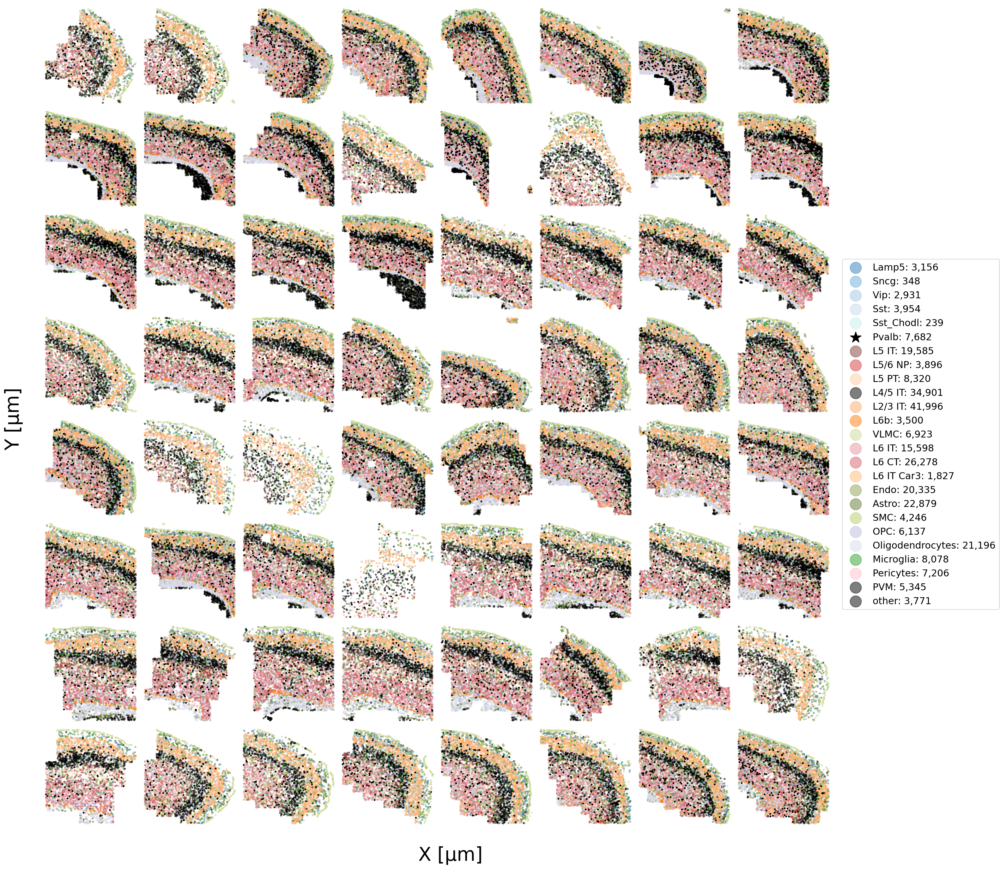

CPU times: user 27.5 s, sys: 488 ms, total: 27.9 s
Wall time: 27.9 s


In [52]:
%%time
fig, ax = plt.subplots(figsize=(24,24), ncols=8, nrows=8)
fig.subplots_adjust(hspace=0, wspace=0)

axs = trim_axs(ax, len(slice_id))

for sidx, (ax, slice_name, tf_rule) in enumerate(zip(axs, slice_id, tf.items())):
    s = gb.get_group(slice_id[sidx])
    
    X_mask = s.index.values.astype(int)
    
    x = mfish.obs["center_x"][X_mask]
    y = mfish.obs["center_y"][X_mask]
    
    ss_labels = mfish.obs.subclass[X_mask]
    
    #c = mfish.obs["subclass_id"].values[X_mask]
    
    for cidx, cluster in enumerate(unique_subclass):
        xx = x[ss_labels == cluster]
        yy = y[ss_labels == cluster]
        color=cluster_cmap.get(cluster, "black")
        
        markerstyle="o"
        s=5
        zorder=1
        edgecolor = "face"
        alpha=0.5
        if cluster == "Pvalb": markerstyle="*";zorder=10; alpha=1; color="k"; markerstyle="*"
        xxx = xx
        yyy = yy
        if tf_rule[1] == "flip_x":
            xxx = -xx
        elif tf_rule[1] == "flip_y":
            yyy = -yyy
        elif tf_rule[1] == "rotate_90":
            xxx = -yy
            yyy = xx
        elif tf_rule[1] == "rotate_90_r":
            xxx = yy
            yyy = -xx
        elif tf_rule[1] == "rotate_180":
            xxx = - xx
            yyy = - yy
        if sidx == 36:
            yyy = xxx
            xxx = -yy
        ax.scatter(xxx, yyy, color=color, label="{}: {:,}".format(cluster, xx.shape[0]), s=s, zorder=zorder, alpha=alpha, marker=markerstyle)
    
    
    ax.xaxis.set_ticklabels([])
    ax.yaxis.set_ticklabels([])
    ax.set_axis_off()

handles, _ = ax.get_legend_handles_labels()
idx = [np.where(unique_subclass==i)[0][0] for i in cluster_order]
handles = np.array(handles)[idx]


#plt.legend(handles, labels, loc="center left",  markerscale=8, bbox_to_anchor=(0.825, 0.5, ), fontsize=15, borderaxespad=0.)
fig.legend(handles, labels, markerscale=8, fontsize=15, loc="center right",borderaxespad=0.1)      # Title for the legend

# Adjust the scaling factor to fit your legend text completely outside the plot
# (smaller value results in more space being made for the legend)
plt.subplots_adjust(right=0.85)
    
fig.text(0.5, 0.1, 'X [µm]', ha='center', va='center', fontsize=30)
fig.text(0.1, 0.5, 'Y [µm]', ha='center', va='center', rotation='vertical', fontsize=30)
plt.savefig(trackfig("../../figures/merfish-updated_subclass_locations.png", TRACKFIG, NB), bbox_inches='tight',dpi=300)
plt.show()

In [109]:
the_chosen_one = 7

In [110]:
mfish.obs

,fovID,fov_x,fov_y,volume,center_x,center_y,slice_id,sample_id,label,subclass,class_label,cell_id,subclass_id
0,13,4539.310,2986.899,992.830060,4738.397298,3075.327399,mouse2_slice31,dataset2_sample4,Astro_1,Astro,Other,0,0
1,290,-4016.860,1404.780,610.091871,-3964.711404,1451.889047,mouse2_slice160,dataset2_sample5,Endo,Endo,Other,1,1
2,113,750.406,1143.102,148.277718,805.843523,1215.035473,mouse2_slice109,dataset2_sample6,SMC,SMC,Other,2,18
3,432,1262.680,-3752.030,249.515471,1348.686198,-3589.955255,mouse1_slice71,dataset1_sample2,Endo,Endo,Other,3,1
4,354,-3627.450,-1987.730,1779.831996,-3584.650904,-1883.105955,mouse2_slice219,dataset2_sample5,L23_IT_3,L2/3 IT,Glutamatergic,4,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
280322,386,774.760,913.600,1208.963097,890.666985,1069.905972,mouse1_slice251,dataset1_sample5,Pvalb_1,Pvalb,GABAergic,280322,17
280323,327,1910.380,1079.280,611.167089,1913.334949,1280.947292,mouse2_slice261,dataset2_sample3,L5_PT_5,L5 PT,Glutamatergic,280323,6
280324,89,3659.910,3432.540,130.928366,3847.387896,3589.662245,mouse1_slice112,dataset1_sample3,L45_IT_4,L4/5 IT,Glutamatergic,280324,3
280325,300,2510.380,1279.280,799.847696,2728.208220,1376.136296,mouse2_slice261,dataset2_sample3,L5_PT_2,L5 PT,Glutamatergic,280325,6


In [111]:
slice_id[the_chosen_one]

'mouse1_slice162'

In [112]:
chosen = mfish[mfish.obs.eval(f"slice_id == '{slice_id[the_chosen_one]}'").values]

In [113]:
chosen

View of AnnData object with n_obs × n_vars = 6963 × 254
    obs: 'fovID', 'fov_x', 'fov_y', 'volume', 'center_x', 'center_y', 'slice_id', 'sample_id', 'label', 'subclass', 'class_label', 'cell_id', 'subclass_id'
    var: 'n_iso'
    layers: 'X', 'log1p', 'norm'

In [114]:
cluster

'Endo'

In [115]:
cluster_order = [
    "L5 IT",
    "L5/6 NP",
    "L5 PT", 
    "L2/3 IT",
    "L6b",
    "L6 IT",
    "L6 CT",
    "L6 IT Car3",
    "Lamp5",
    "Sncg",
    "Vip",
    "Sst",
    "Pvalb",
     "Endo"
]

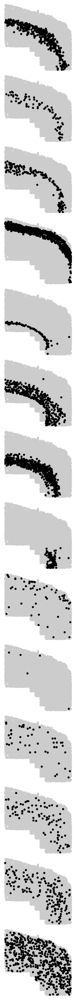

In [120]:
n_subclasses = len(cluster_order)

fig, axs = plt.subplots(figsize=(5,5*n_subclasses), nrows=n_subclasses)
fig.subplots_adjust(hspace=0, wspace=0)

ss_labels = chosen.obs.subclass.values

for cidx, (ax, cluster) in enumerate(zip(axs, cluster_order)):
    x = chosen.obs["center_x"].values
    y = chosen.obs["center_y"].values
    c = np.ones(x.shape[0])*0.1
    
    c[ss_labels == cluster] = 1
    
    argsort = np.argsort(c)
    x = x[argsort]
    y = y[argsort]
    c = c[argsort]
    
    ax.scatter(x, y, c=c, cmap="nipy_spectral_r", s=50)
    ax.xaxis.set_ticks([])
    ax.yaxis.set_ticks([])
    ax.xaxis.set_ticklabels([])
    ax.yaxis.set_ticklabels([])
    
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    

    ax.set_axis_off()
    ax.set_ylabel(cluster)
    
plt.savefig(trackfig("../../figures/merfish-updated_subclass_loc_spatial_atlas.png", TRACKFIG, NB), bbox_inches='tight',dpi=300)

fig.show()

In [123]:
len(unique_subclass)

25

CPU times: user 16 s, sys: 337 ms, total: 16.4 s
Wall time: 16.3 s


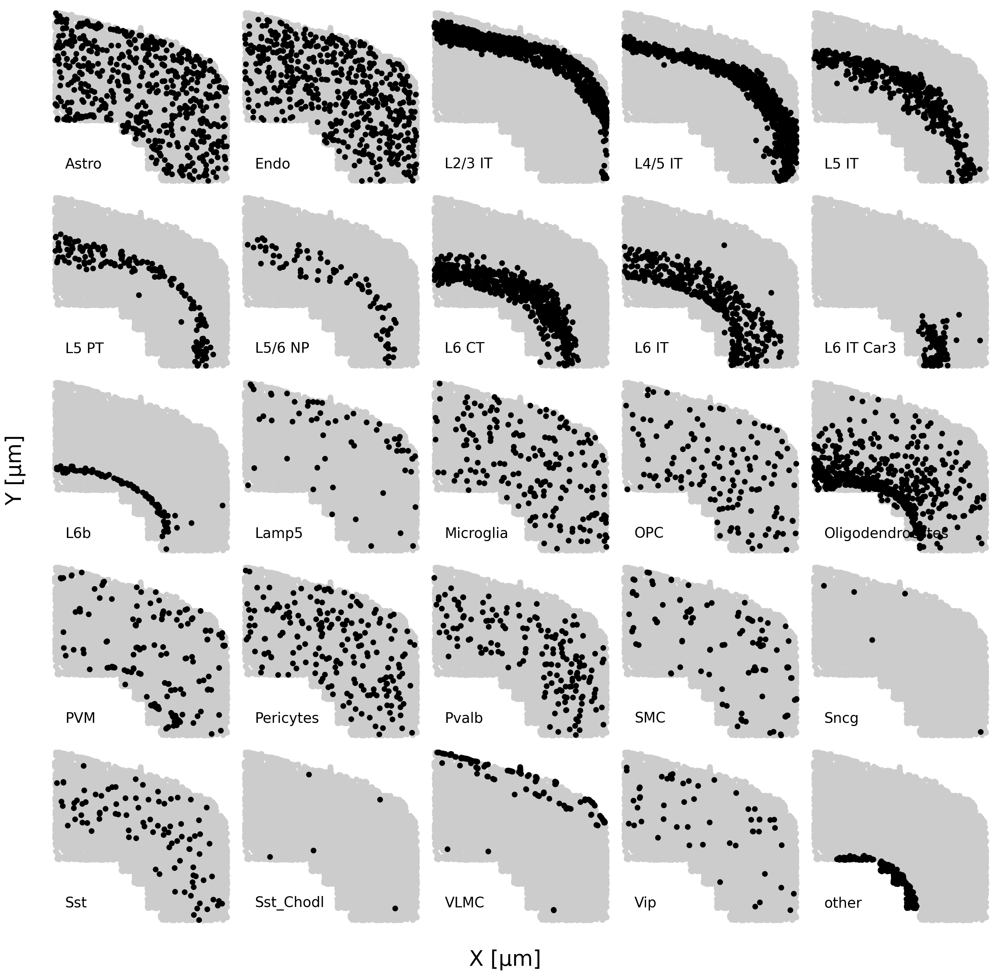

In [129]:
%%time
fig, ax = plt.subplots(figsize=(24,24), ncols=5, nrows=5)
fig.subplots_adjust(hspace=0, wspace=0)

n_subclasses = len(unique_subclass)

axs = trim_axs(ax, len(slice_id))

# build a rectangle in axes coords
left = .1
bottom = .1

for cidx, (ax, cluster) in enumerate(zip(axs, unique_subclass)):
    x = chosen.obs["center_x"].values
    y = chosen.obs["center_y"].values
    c = np.ones(x.shape[0])*0.1
    
    c[ss_labels == cluster] = 1
    
    argsort = np.argsort(c)
    x = x[argsort]
    y = y[argsort]
    c = c[argsort]
    
    ax.scatter(x, y, c=c, cmap="nipy_spectral_r", s=50)
    ax.xaxis.set_ticks([])
    ax.yaxis.set_ticks([])
    ax.xaxis.set_ticklabels([])
    ax.yaxis.set_ticklabels([])
    
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    

    ax.set_axis_off()
    ax.set_ylabel(cluster)
    
    ax.text(left, bottom, f'{cluster}',
            horizontalalignment='left',
            verticalalignment='bottom',
            transform=ax.transAxes)
fig.text(0.5, 0.1, 'X [µm]', ha='center', va='center', fontsize=30)
fig.text(0.1, 0.5, 'Y [µm]', ha='center', va='center', rotation='vertical', fontsize=30)
plt.savefig(trackfig("../../figures/merfish-updated_subclass_location_grid.png", TRACKFIG, NB), bbox_inches='tight',dpi=300)

fig.show()

In [131]:
x = chosen.obs["center_x"].values
y = chosen.obs["center_y"].values

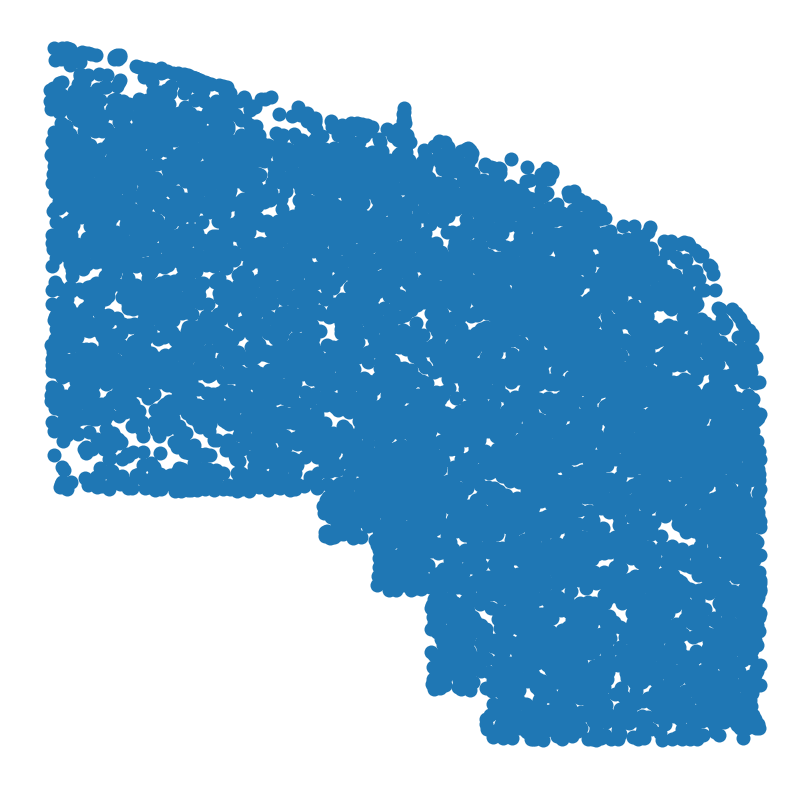

In [135]:
fig, ax = plt.subplots(figsize=(7,7))
ax.scatter(x,y)

ax.set_axis_off()
fig.show()